In [7]:
import pandas as pd ##import the pandas library as pd
import numpy as np  ##import the numpy library as np
import cv2 ##import opencv library
import matplotlib.pyplot as plt ##import matplotlib as plt

from glob import glob ##import glob library
import warnings
warnings.filterwarnings('ignore')

In [8]:
import IPython.display as ipd ##import IPython.display
from tqdm import tqdm ##import tqdm library

import subprocess ##import subprocess library

plt.style.use('ggplot') ##plot using ggplot

# Converting video types

In [9]:
!ls -GFlash --color

'ls' is not recognized as an internal or external command,
operable program or batch file.


# Display Video in Notebook

In [10]:
ipd.Video('new_cars.mp4', width=700) ##upload the video

#the full path is not requried here because i am using VS-CODE

# Open the Video and Read Metadata

In [11]:
## Load in video capture
cap = cv2.VideoCapture('new_cars.mp4')

#the full path is not requried here because i am using VS-CODE

In [12]:
## Total number of frames in video
cap.get(cv2.CAP_PROP_FRAME_COUNT)

2398.0

In [13]:
# Video height and width
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)  ##define the height
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)  ##define the width
print(f'Height {height}, Width {width}')  ##print the height and width

Height 720.0, Width 1280.0


In [14]:
# Get frames per second
fps = cap.get(cv2.CAP_PROP_FPS)  ##calculating the frames per second
print(f'FPS : {fps:0.2f}')  ##print the fps value

FPS : 59.94


In [15]:
cap.release() ##release the software resource

# Pulling in Images from Video

In [16]:
cap = cv2.VideoCapture('new_cars.mp4')  ##capturing snips from the video
ret, img = cap.read()  ##reads a frame from the video capture object
print(f'Returned {ret} and img of shape {img.shape}') ##print() is a function that displays a message to the console.
##'f'...' is a string literal that allows for variable interpolation using curly braces {}.
##ret is a boolean value that indicates whether the frame was successfully read or not.

Returned True and img of shape (720, 1280, 3)


In [17]:
## Helper function for plotting opencv images in notebook
def display_cv2_img(img, figsize=(10, 10)):
    # Convert the image from BGR to RGB format
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Create a new figure with a given size
    fig, ax = plt.subplots(figsize=figsize)
    # Display the image on the axes with the RGB format
    ax.imshow(img_)
    # Remove the axis ticks and labels
    ax.axis("off")

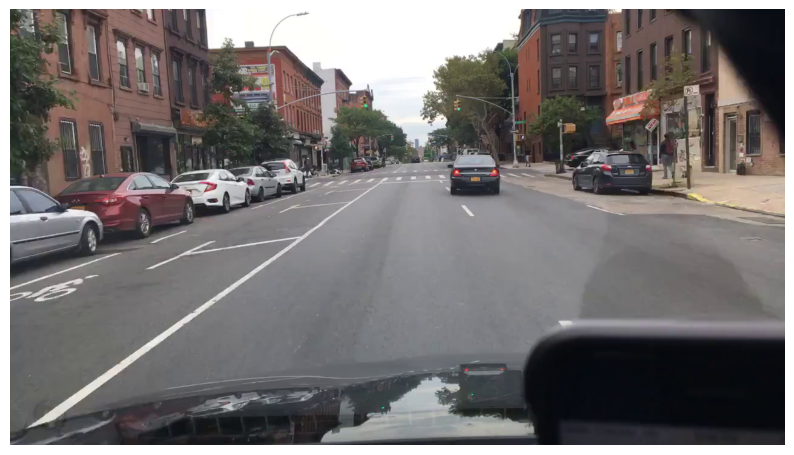

In [18]:
display_cv2_img(img) ##displaying the image

In [19]:
cap.release() ##release the software resource

# Display multiple frames from the video

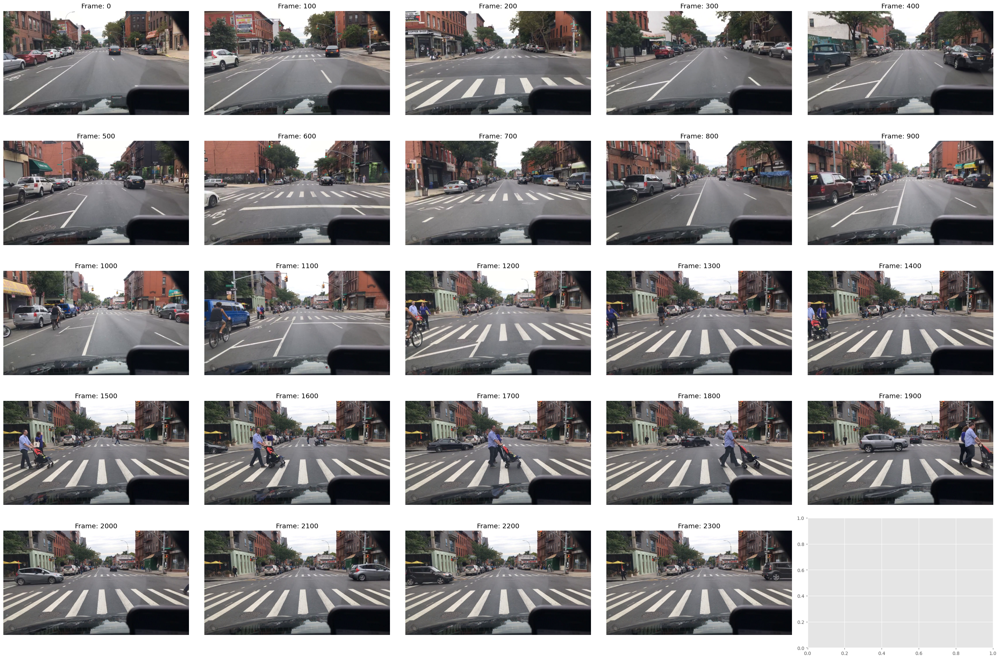

In [20]:
fig, axs = plt.subplots(5, 5, figsize=(30, 20))  ##creates a 5x5 grid of subplots with a given figure size.
axs = axs.flatten()  ## converts the 2D axs array into a 1D array for easier indexing.

cap = cv2.VideoCapture("new_cars.mp4") ##opens the video file "new_cars.mp4" for reading.
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT)) ##gets the total number of frames in the video

img_idx = 0  ##initializes the index of the subplot to display the next frame
for frame in range(n_frames): ##loops over all frames in the video
    ret, img = cap.read()  ##reads the next frame from the video
    if ret == False:  ##checks if there are no more frames to read and exits the loop if so
        break
    if frame % 100 == 0: ##displays only every 100th frame in the subplot
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  ##displays the current frame in the appropriate subplot, after converting it from BGR to RGB format.
        axs[img_idx].set_title(f'Frame: {frame}') ##sets the title of the subplot to indicate the frame number
        axs[img_idx].axis('off') ##removes the axis ticks and labels from the subplot
        img_idx += 1  ##increments the index of the subplot to display the next frame

plt.tight_layout()  ## adjusts the spacing between subplots to prevent overlap
plt.show()  ##displays the plot with all subplots
cap.release() ##releases the video capture object to free up system resources

# Add Annotations to Video Images

In [21]:
labels = pd.read_csv('mot_labels.csv', low_memory=False)
## Read the MOT labels CSV file into a pandas DataFrame and store it in the variable "labels"

video_labels = (labels.query('videoName == "026c7465-309f6d33"')
                .reset_index(drop=True)
                .copy())
## Filter the labels DataFrame to include only the rows corresponding to a specific video file
## Reset the index of the resulting DataFrame and create a copy of it

video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")
## Calculate the frame number of each bounding box annotation in the video
## The frame number is derived from the frame index, which is the index of the frame in the original video
## The frame rate of the video is assumed to be 11.9 frames per second, and the resulting frame number is rounded to the nearest integer
## The frame number is added as a new column "video_frame" to the video_labels DataFrame

In [22]:
video_labels["category"].value_counts() ##count categories

car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: category, dtype: int64

In [23]:
cap = cv2.VideoCapture("new_cars.mp4")
## Create a VideoCapture object to read frames from a video file named "new_cars.mp4"
## The object is stored in the variable "cap"

n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
## Get the total number of frames in the video by calling the get() method of the VideoCapture object
## The get() method takes a property ID as an argument, and in this case, the property ID is CAP_PROP_FRAME_COUNT
## The resulting number of frames is converted to an integer and stored in the variable "n_frames"

img_idx = 0
## Initialize a variable "img_idx" to 0 to keep track of the current frame index

for frame in range(n_frames):
    ## Loop through all frames in the video, using the "range()" function to generate a sequence of frame indices

    ret, img = cap.read()
    ## Read the next frame from the video using the VideoCapture object's read() method
    ## The read() method returns a Boolean value indicating whether the read operation was successful (stored in the variable "ret")
    ## and the actual image data (stored in the variable "img")

    if ret == False:
        break
    ## If the read() method returns False, it means that there are no more frames to read from the video
    ## In this case, break out of the loop and stop reading frames

    if frame == 1035:
        break
    ## If the current frame index is equal to 1035, break out of the loop and stop reading frames
    ## This line of code effectively skips to a specific frame in the video, rather than reading all frames

cap.release()
## Release the resources held by the VideoCapture object by calling its release() method
## This is good practice to ensure that the video file is properly closed and any system resources are freed up

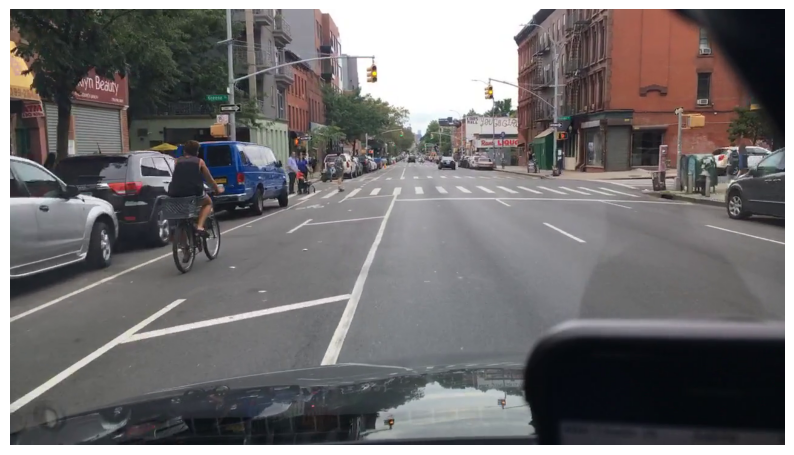

In [24]:
display_cv2_img(img) ##display the image

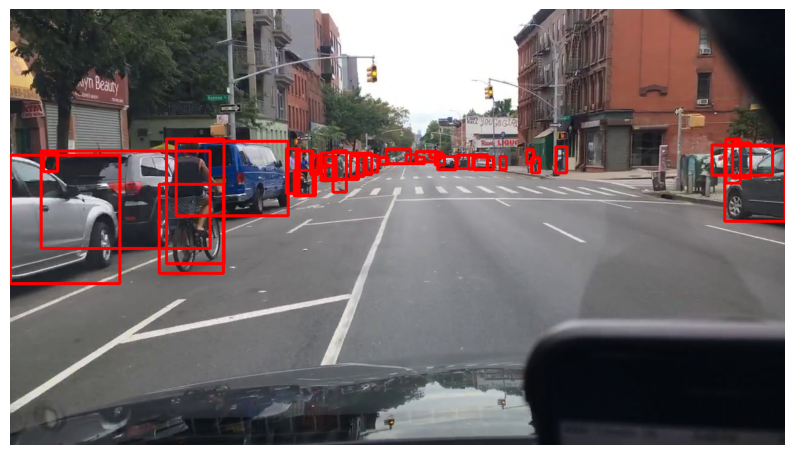

In [25]:
img_example = img.copy()
## Create a copy of the last frame read from the video and store it in a new variable "img_example"
## This is done to avoid modifying the original image data, in case we need it later

frame_labels = video_labels.query('video_frame == 1035')
## Query the "video_labels" DataFrame to select only the rows that correspond to frame 1035 of the video
## The resulting subset of the DataFrame is stored in a new variable "frame_labels"

for i, d in frame_labels.iterrows():
    ## Loop through each row in the "frame_labels" DataFrame using the "iterrows()" method

    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    ## Get the (x1, y1) coordinates of the top-left corner of the bounding box from the current row
    ## The values are converted to integers and stored in a new variable "pt1"

    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    ## Get the (x2, y2) coordinates of the bottom-right corner of the bounding box from the current row
    ## The values are converted to integers and stored in a new variable "pt2"

    cv2.rectangle(img_example, pt1, pt2, (0, 0, 255), 3)
    ## Draw a red rectangle on the image "img_example" using the OpenCV function "cv2.rectangle()"
    ## The rectangle is defined by the top-left and bottom-right corner coordinates, and has a thickness of 3 pixels
    ## The rectangle color is specified as (0, 0, 255), which corresponds to the BGR color value for red

display_cv2_img(img_example)
## Display the modified image "img_example" using the custom function "display_cv2_img()"
## This function converts the BGR color format to RGB and removes the axis labels to make the image more presentable.

# Displaying Colored by Category

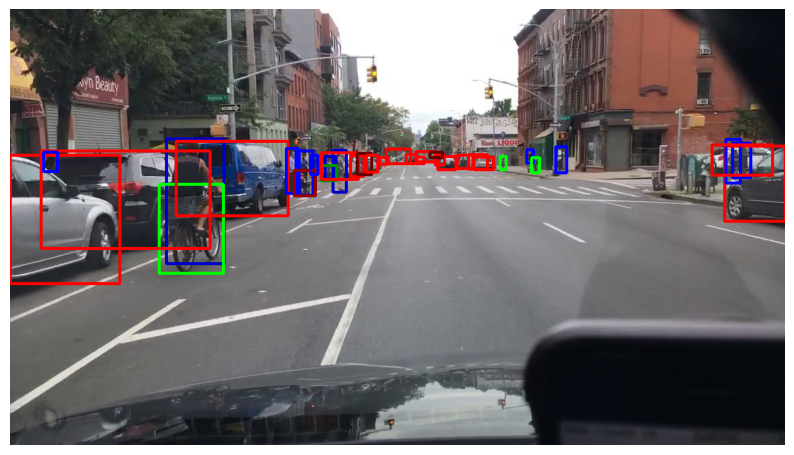

In [26]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 0, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
} ##add numerics

img_example = img.copy() ##copy the image
frame_labels = video_labels.query('video_frame == 1035') ##taking frame number 1035
for i, d in frame_labels.iterrows(): ##initilize for loop
    pt1 = int(d['box2d.x1']), int(d['box2d.y1']) ##inilize pt1
    pt2 = int(d['box2d.x2']), int(d['box2d.y2']) ##inilize pt2
    color = color_map[d['category']] ##differenciate categories
    cv2.rectangle(img_example, pt1, pt2, color, 3) ##applu opencv

display_cv2_img(img_example) ##display images

## Adding Text

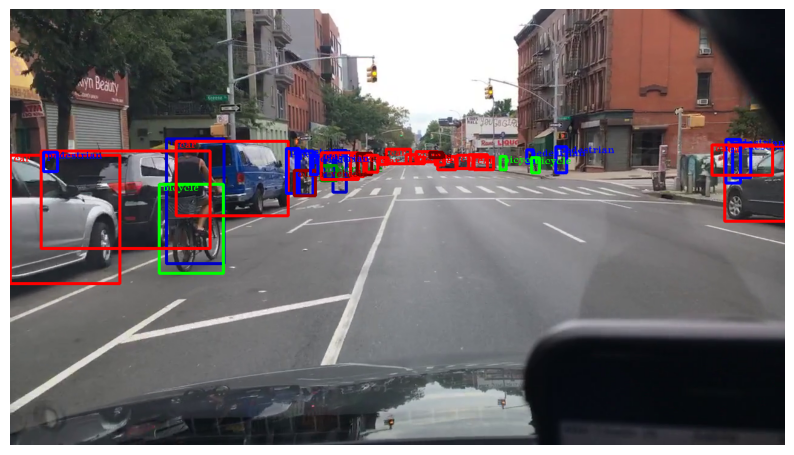

In [27]:
frame_labels = video_labels.query("video_frame == @frame") ## Selects all the labels of the current frame from the video_labels dataframe and stores them in a new dataframe called frame_labels
font = cv2.FONT_HERSHEY_TRIPLEX  ## Defines the font to be used for text in the image as cv2.FONT_HERSHEY_TRIPLEX
img_example = img.copy() ## Creates a copy of the original image to be used for drawing bounding boxes and labels
for i, d in frame_labels.iterrows(): ## Iterates over each label in the frame_labels dataframe
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"]) ## Extracts the coordinates of the top-left corner of the bounding box and stores them in a tuple called pt1
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"]) ## Extracts the coordinates of the bottom-right corner of the bounding box and stores them in a tuple called pt2
    color = color_map[d["category"]] ## Gets the color to be used for the bounding box and label based on the category of the object
    img_example = cv2.rectangle(img_example, pt1, pt2, color, 3) ## Draws a rectangle with the given coordinates and color on the img_example image
    pt_text = int(d["box2d.x1"]) + 5, int(d["box2d.y1"] + 10) ## Calculates the coordinates of the text to be added to the image and stores them in a tuple called pt_text
    img_example = cv2.putText(img_example, d["category"], pt_text, font, 0.5, color) ## Adds the label text to the image at the given coordinates and with the given font, size and color
display_cv2_img(img_example) ## Displays the final image with bounding boxes and labels added
cap.release() ## Releases the video capture object to free up system resources.

# Label and output Annotated Video

In [28]:
def add_annotations(img, frame, video_labels): #inialize functions
    max_frame = video_labels.query("video_frame <= @frame")["video_frame"].max()  ## Finds the maximum frame number that is less than or equal to the current frame and stores it in a variable called max_frame
    frame_labels = video_labels.query("video_frame == @max_frame") ## Selects all the labels of the max_frame from the video_labels dataframe and stores them in a new dataframe called frame_labels
    for i, d in frame_labels.iterrows(): ## Iterates over each label in the frame_labels dataframe
        pt1 = int(d["box2d.x1"]), int(d["box2d.y1"]) ## Extracts the coordinates of the top-left corner of the bounding box and stores them in a tuple called pt1
        pt2 = int(d["box2d.x2"]), int(d["box2d.y2"]) ## Extracts the coordinates of the bottom-right corner of the bounding box and stores them in a tuple called pt2
        color = color_map[d["category"]] ## Gets the color to be used for the bounding box and label based on the category of the object
        img = cv2.rectangle(img, pt1, pt2, color, 3) ## Draws a rectangle with the given coordinates and color on the img image
    return img ## Returns the updated image with bounding boxes and labels added for the current frame

In [29]:
!rm -r out_test.mp4

'rm' is not recognized as an internal or external command,
operable program or batch file.


In [30]:
VIDEO_CODEC = "mp4v" ## Defines the video codec to be used for output video as mp4v
fps = 59.94 ## Defines the frame rate of the output video as 59.94 frames per second
width = 1280 ## Defines the width of the output video as 1280 pixels
height = 720 ## Defines the height of the output video as 720 pixels
out = cv2.VideoWriter("out_test.mp4", ## Initializes a VideoWriter object to write the output video to a file named "out_test.mp4"
                cv2.VideoWriter_fourcc(*VIDEO_CODEC), # # Specifies the codec to be used for encoding the video frames
                fps, ## Specifies the frame rate of the output video
                (width, height)) ## Specifies the resolution of the output video

cap = cv2.VideoCapture("new_cars.mp4") ## Initializes a VideoCapture object to read the input video from a file named "new_cars.mp4"
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT)) ## Gets the total number of frames in the input video and stores it in a variable called n_frames

for frame in tqdm(range(n_frames), total=n_frames): ## Iterates over each frame in the input video
    ret, img = cap.read() ## Reads the next frame from the input video and stores it in a variable called img

    if ret == False: ## If the frame cannot be read, break out of the loop
        break
    img = add_annotations(img, frame, video_labels) ## Adds bounding boxes and labels to the current frame using the add_annotations function
    out.write(img) ## Writes the updated frame to the output video file
out.release() ## Releases the VideoWriter object to finalize the output video file
cap.release() ## Releases the VideoCapture object to free up system resources

100%|██████████| 2398/2398 [02:28<00:00, 16.20it/s]


In [31]:
!ls -GFlash -color

'ls' is not recognized as an internal or external command,
operable program or batch file.


# Convert our labeled output to mp4 and view

In [32]:
tmp_output_path = "out_test.mp4" ## Specifies the path of the input video file that needs to be compressed
output_path = "out_test_compressed.mp4" ## Specifies the path of the compressed output video file that will be generated

In [33]:
ipd.Video('out_test_compressed.mp4', width=600)